In [ ]:
# norm

In [ ]:
import pandas as pd
import scipy.io
import scipy.sparse
import scanpy as sc
import gzip

import numpy as np
import seaborn as sns
import random

from scipy.stats import median_abs_deviation
from matplotlib import pyplot as plt

from matplotlib import colors
import matplotlib.cm as cm

from matplotlib.colors import TwoSlopeNorm, LinearSegmentedColormap

# global seeds
np.random.seed(42)
random.seed(42)

sc.settings.set_figure_params(figsize=(5, 5), facecolor="white")

In [ ]:
adata_fibroblasts = sc.read_h5ad("../../data/IPF_mesenchymal.h5ad")

In [ ]:
adata_fibroblasts.X = adata_fibroblasts.layers['counts'].copy().astype("float32")

In [ ]:
# normalize for scoring
sc.pp.normalize_per_cell(adata_fibroblasts, counts_per_cell_after=1e4)
sc.pp.log1p(adata_fibroblasts)
sc.pp.scale(adata_fibroblasts)

In [ ]:
# TLR signaling gene signature

genes = "AKT3,TLR6,TAB1,TIRAP,CHUK,MAP3K8,MAPK14,TICAM1,CTSK,AKT1,AKT2,TAB2,FOS,PIK3R5,LY96,TBK1,IFNA1,IFNA2,IFNA4,IFNA5,IFNA6,IFNA7,IFNA8,IFNA10,IFNA13,IFNA14,IFNA16,IFNA17,IFNA21,IFNAR1,IFNAR2,IFNB1,TICAM2,IKBKB,IL1B,IL6,CXCL8,IL12A,IL12B,CXCL10,IRAK1,IRF3,IRF5,IRF7,JUN,LBP,CXCL9,MYD88,NFKB1,NFKBIA,IRAK4,TLR7,TLR8,PIK3CA,PIK3CB,PIK3CD,PIK3CG,PIK3R1,PIK3R2,TLR9,TOLLIP,MAPK1,MAPK3,MAPK8,MAPK11,MAPK9,MAPK10,MAPK13,MAP2K1,MAP2K2,MAP2K3,MAP2K6,MAP2K7,RAC1,RELA,MAPK12,CCL3,CCL4,CCL5,CXCL11,MAP2K4,SPP1,STAT1,MAP3K7,TLR1,TLR2,TLR3,TLR4,TLR5,TNF,TRAF3,TRAF6,CASP8,PIK3R3,IKBKG,RIPK1,FADD,CD14,CD80,CD86,CD40,IKBKE"
genes = genes.split(',')
genes

In [25]:
# score each cell for gene signature
sc.tl.score_genes(adata_fibroblasts, gene_list=genes, score_name="TLR_pathway_gene_signature")

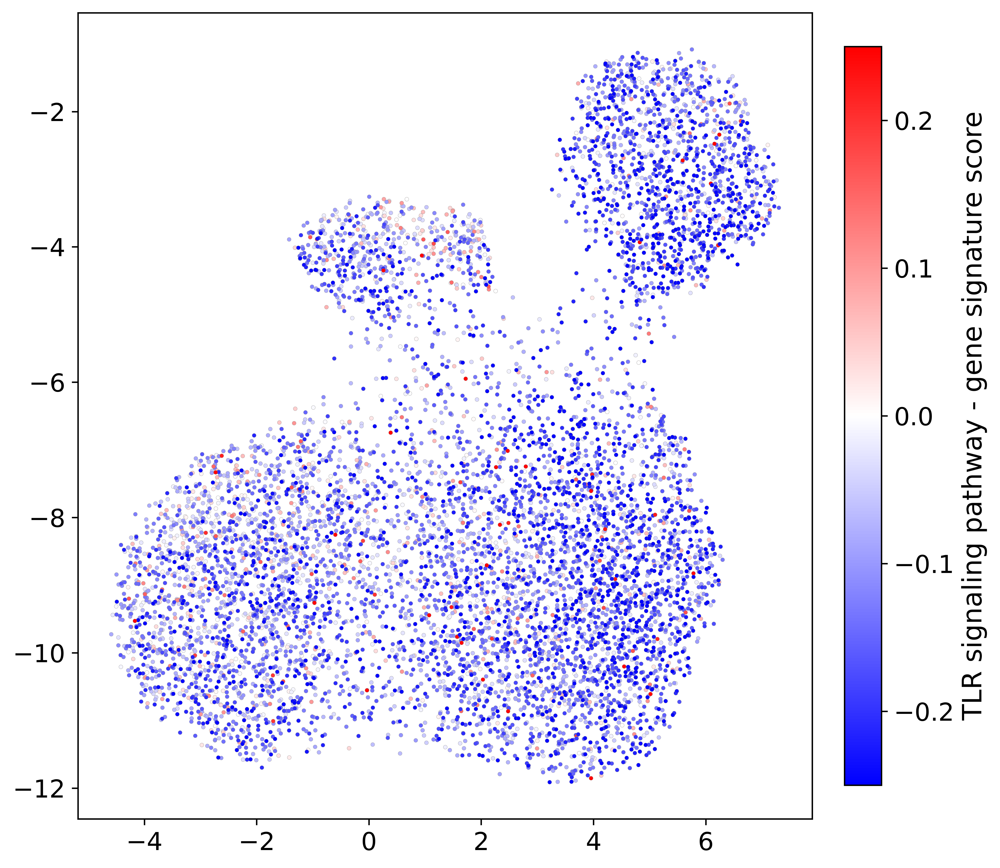

In [ ]:
# scores and umap coords
scores = adata_fibroblasts.obs["TLR_pathway_gene_signature"].to_numpy()
x = adata_fibroblasts.obsm["X_umap"][:, 0]
y = adata_fibroblasts.obsm["X_umap"][:, 1]

# colors
cmap = LinearSegmentedColormap.from_list("custom_div", ["blue", "white", "red"])

# clip limits
# limit = np.max(np.abs(scores))
# norm = TwoSlopeNorm(vmin=-limit, vcenter=0, vmax=limit)

norm = TwoSlopeNorm(vmin=-0.25, vcenter=0, vmax=0.25)

# sort so high values plotted last
order = np.argsort(np.abs(scores))
x_sorted = x[order]
y_sorted = y[order]
sorted_scores = scores[order]

# plot
fig, ax = plt.subplots(figsize=(8, 7), dpi=300)

sc = ax.scatter(
    x_sorted, y_sorted,
    c=sorted_scores,
    cmap=cmap, norm=norm,
    s=5,
    alpha=1,
    linewidths=0.1,
    edgecolors="gray",
)

ax.set_title("", fontsize=16)
ax.set_xlabel("")
ax.set_ylabel("")
ax.grid(False)

# colorbar
cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("TLR signaling pathway - gene signature score", fontsize=15)

plt.tight_layout()
plt.show()

fig.savefig(
    "../plots/IPF_mesenchymal_TLR_pathway_gene_score.png",
    dpi=300,
    bbox_inches="tight",
)
plt.close(fig)


/tmp/ipykernel_12392/817740047.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sorted_scores = tissue_scores[order]
/tmp/ipykernel_12392/817740047.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sorted_scores = tissue_scores[order]
/tmp/ipykernel_12392/817740047.py:29: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sorted_scores = tissue_scores[order]
/tmp/ipykernel_12392/817740047.py:54: UserWarning: This figure includes A

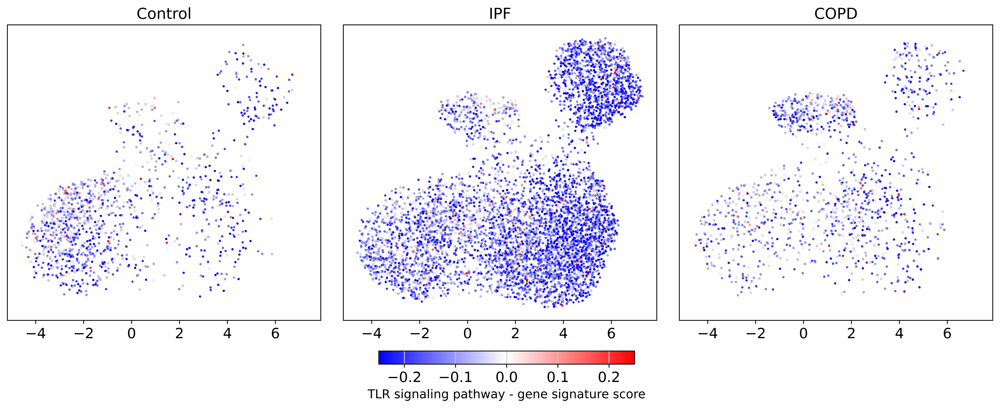

In [ ]:
# divided by condition
tissue_labels = ["Control", "IPF", "COPD"]
scores = adata_fibroblasts.obs['TLR_pathway_gene_signature']

# colors
cmap = LinearSegmentedColormap.from_list("custom_div", ["blue", "white", "red"])

# clip limits
vmin, vmax = -0.25, 0.25
norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

# subplots one per tissue
fig, axs = plt.subplots(1, len(tissue_labels), figsize=(14, 6), dpi=300, sharex=True, sharey=True)

for i, tissue in enumerate(tissue_labels):
    ax = axs[i]
    idx = adata_fibroblasts.obs['Disease_Identity'] == tissue
    x = adata_fibroblasts.obsm['X_umap'][idx, 0]
    y = adata_fibroblasts.obsm['X_umap'][idx, 1]
    tissue_scores = scores[idx]

    # sort so high values plotted last
    order = np.argsort(np.abs(tissue_scores))
    x_sorted = x[order]
    y_sorted = y[order]
    sorted_scores = tissue_scores[order]

    sc = ax.scatter(
        x_sorted, y_sorted,
        c=sorted_scores,
        cmap=cmap, norm=norm,
        s=5,
        alpha=1,
        linewidths=0.1,
        edgecolors="gray",
    )

    ax.set_title(tissue, fontsize=15)
    ax.set_xlabel("", fontsize=10)
    if i == 0:
        ax.set_ylabel("", fontsize=10)
    else:
        ax.set_yticks([])
    ax.grid(False)

# colorbar
cbar_ax = fig.add_axes([0.385, 0.15, 0.25, 0.03])
cbar = fig.colorbar(sc, cax=cbar_ax, orientation="horizontal")
cbar.set_label("TLR signaling pathway - gene signature score", fontsize=12)

plt.tight_layout()
plt.subplots_adjust(bottom=0.25)

plt.show()

fig.savefig(
    "../plots/IPF_TLR_mesenchymal_pathway_gene_score_per_condition.png",
    dpi=300,
    bbox_inches="tight",
)
plt.close(fig)
